
# Reinventing the wheel: simulating collisions

I am not a game designer; I have never used any engines such as Unity, nor have I done any 3D modeling before. Buuuuut....

I really like animating physical systems. In my opinion, most Physics undergraduate curricula lack one thing in common: heavyweight numerics, either by solving the differential equations we derive (think of electromagnetic waves, quantum systems) or simulating complex systems, like gravitational N-body simulations. 

Sometimes, I like to reinvent the wheel. [Someone said](https://academia.stackexchange.com/a/155439):
> When you reinvent the wheel, you end up learning a great deal about why wheels are round.

What I do is that, instead of getting a textbook and start learning something, I often prefer the 10x more expensive approach of thinking hard about it and try to derive consequences myself. Once I get tired of this long-winded endeavor and finally decide to refer to real references, there is this warm feeling of reading about something you rediscovered yourself.

So, on that note -- I will try to build a formalism for how to do particle simulations for particles restricted by walls of any shape. Some day in the future I will actually go read about any of this.

> By the way: a lot of things here will be *expensive*, as in $O(n^2)$ or $O(n^3)$ in the number of particles. Maybe it can be optimized in the future, ie. being more careful about partioning space.

# Formalism of things hitting walls

The most natural mathematical framework for us is to consider physical space as being $\mathbf R^n$ (where $n$ can be 2 or 3) and time to be a discrete set of time-steps $\{t_1=0,t_2,\ldots, t_n=T\}$. This is because time-evolution of physical systems needs us to discretize continuous time.

Now, we want to consider a substance moving around here. The (conceptually) simplest description we can use is that of a set of **particles** that don't interact among themselves. We know from [ideal gas theory](https://en.wikipedia.org/wiki/Ideal_gas) that, despite this simplified assumption, we can retrieve many properties of realistic systems from this description.

With that being said, we want our particles to be able to interact with the walls of whatever compartment they are in (this is also what we do for ideal gases). So it makes sense to consider a formalism where we can easily define a volume and its walls. 

## Geometry: domains and walls

We define the **domain** where our substance (which we will now think of as a gas) lives as the locus 

$$\boxed{\Omega \equiv \{x \in\mathbf R^n:\omega(x) >0\}}$$

where $\omega: \mathbf R^n \to \mathbf R$ is some real-valued function. That is, we consider the domain as the set of points where this function is positive.

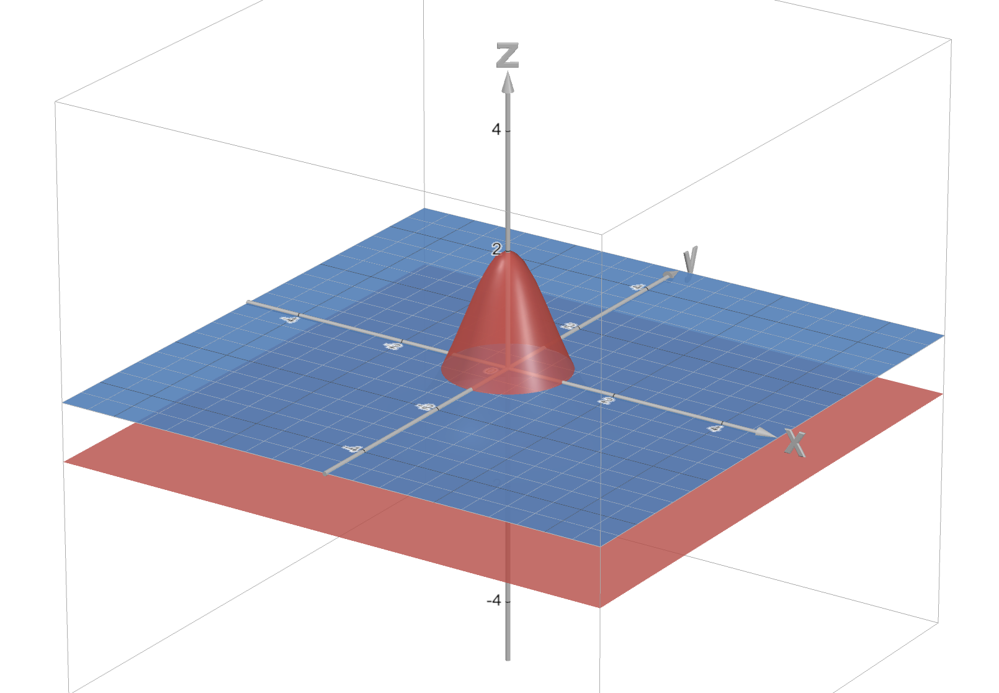

> Example: one could choose $\omega(x,y) = 3\exp(-x^2-y^2) - 1$. This function is positive inside the circle of radius $\sqrt{\log 3}$, zero on the circle, and negative outside.

What do we want of $\omega$? It makes sense to require it to be continuous; we keep hypotheses regarding smoothness on hold for now.

Now let us consider a single particle. Its position at any time $t_i$ is given by a vector $x(t_i)$, which evolves according to Newton's second law. Numerically, we know how to do this via various algorithms, such as the [Euler method](https://en.wikipedia.org/wiki/Euler_method), [leapfrog integration](https://en.wikipedia.org/wiki/Leapfrog_integration) or [Runge-Kutta methods](https://en.wikipedia.org/wiki/Runge%E2%80%93Kutta_methods). 

We assume that there exists an algorithm $\mathrm{evolution}()$ which takes an initial position, an initial velocity, and a timestep, and returns the next position and velocities:

$$\boxed{x_{t+\Delta t}, v_{t+\Delta t} = \mathrm{evolution}(x_t, v_t, \Delta t).}$$

But collisions against walls are not 100% included in this formalism: they are, effectively, an instantaneous infinite force applied to the particle (see Appendix below). Hence we need to come up with a procedure to simulate collisions.

Define the wall as the boundary 

$$\partial \Omega=\{x\in\mathbf R^n:\omega(x)=0\};$$

I am pretty confident that requiring $\partial \Omega$ to be a regular surface should be enough; numerically, we can accept a few (ie. finite number of) points where the normal vector is not well-defined, since there is zero probability a particle will collide with them.

Then, on what follows, I assume 

$$\hat n(x) = \frac{\nabla \omega(x)}{|\nabla \omega(x)|},\quad x \in \partial \Omega$$

is a well-defined, *inward-* pointing normal vector.
> Usually, normal vectors are defined outward-pointing -- see the figure below for an example ([source](https://www.circuitbread.com/textbooks/introduction-to-electricity-magnetism-and-circuits/gausss-law/electric-flux)). We choose inward since we care about the geometry inside the domain, which depends on the inward normal. You can equivalently define $\hat n$ as the outward-pointing normal vector and formally substitute $\hat n \to -\hat n$ in all subsequent formulas.

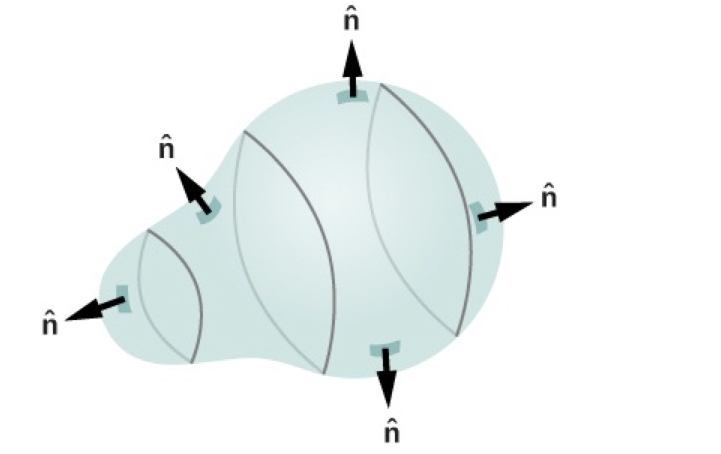

## Collision detection

Since time is discretized, we can consider a particle's trajectory $x(t)$ really as being sampled on the time steps: $x(t_0), x(t_1),\ldots, x(t_n)$. If we observe a situation where 

$$x(t_i) \in \Omega\quad \mbox{ but }\quad x(t_{i+1})\notin \Omega \qquad (\mbox{i.e.}\quad  \omega(x(t_i)) > 0,\quad \omega(x(t_{i+1}))\leq 0)$$

then we can be sure there should have been a collision against the wall at some instant in $]t_{i}, t_{i+1}]$; we then need to artificially change $x(t_{i+1})$ so that it accounts for collision effects.

Can we find out when the collision happened? For simplicity call $x_i \equiv x(t_i)$. Let us assume that the trajectory between $x_i$ and $x_{i+1}$ is approximately linear, so that it can be parameterized by $\lambda \in [0,1]$ as $x_i + \lambda (x_{i+1}-x_i)$. By continuity of $\omega$, there exists $\lambda_*$ such that 

$$\boxed{\omega(x_i+\lambda_*(x_{i+1}-x_i))=0.}$$

Assuming $\vert \lambda_* (x_{i+1} - x_i)\vert$ to be small, we can Taylor expand to first order and solve for $\lambda_*$: 

$$\lambda_* \approx - \frac{\omega(x_i)}{(x_{i+1} - x_i)\cdot \nabla \omega(x_i)}.$$

Notice that calculating this quantity is slightly expensive -- it requires us to compute the gradient at $x_i$.
> There is an even more precise way: we could expand both around $x_i$ and $x_{i+1}$ and combine the results. 

So now we know how far along the segment between the two points one should find the collision point, namely, 

$$x_*=x_i+\lambda_* (x_{i+1}-x_i).$$

## Shifting positions and velocities

By geometry (see discussion below), we can now find that the new position for the reflected particle is 

$$\boxed{x_{i+1}' = x_{i+1}-2(1-\lambda_*)[(x_{i+1}-x_i)\cdot \hat n_*] \hat n_*}$$

where $\hat n_* \equiv \hat n(x_*)$.

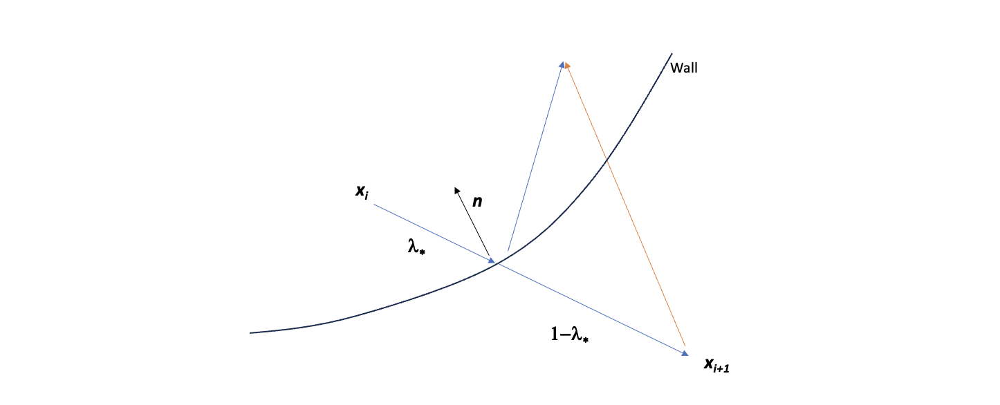

> To see this: the vector pointing from $x_i$ to $x_{i+1}$ is their difference $x_{i+1}-x_i$. Its projection along the surface normal $\hat n_*$ is $[(x_{i+1}-x_i)\cdot \hat n_*]\hat n_*$. From $x_{i+1}$, how much do we need to "walk along" the projection? Since it takes "time" $\lambda_*$ to go from $x_i$ to the wall ($x_*$), we are left with an amount of $1-\lambda_*$ of time to go up; we need a factor of 2 to walk the same amount from $x_{i+1}$. Hence, $$x_{i+1}'= x_{i+1} - 2(1-\lambda_*)[(x_{i+1}-x_i)\cdot \hat n_*]\hat n_*.$$

What happens to velocity? Consider the velocity vector $v_-$ right before collision. The component parallel to $\hat n_*$, ie. $v_- \cdot \hat n_*$, is inverted after the elastic collision; the perpendicular component $v - ( v_-\cdot \hat n_*)\hat n_*$ is kept equal. Hence, a shock against that wall corresponds to the following map:

$$ v_- \mapsto  v_+ =   v_- - 2( v_-\cdot \hat n_*) \hat n_*$$

However, what is the best approximation we have for $v_-$? Given $v_i \equiv v(t_i)$, we know that a time of $\lambda_*(t_{i+1} - t_i)$ is elapsed since $t_i$ and the hypothetical collision instant; hence, the velocity right before collision is

$$\underline{\;\;} , v_- = \mathrm{evolution}(x_0 = x(t_i),\; v_0 = v(t_i),\; \Delta t = \lambda_* (t_{i+1} - t_i))$$


> This step is very expensive -- it requires another computation of evolution, which may require to compute $n$ forces between particles. For small time steps, it is likely that just using $v_- \approx v(t_i)$ is sufficient.

Hence, we have all the ingredients for an algorithm. We first tentatively evolve all particles to their next position; then, if any fall out of the domain, we fix their position and velocity via the procedures above.

**INPUTS**: 
* Function $\omega(x)$ and its gradient $\nabla \omega(x)$ - ideally $\omega$ must be cheap to evaluate and its gradient must be pre-calculated analytically
* $N$ particles with mass $m$ and initial positions / velocities $x^{(i)}_0, v^{(i)}_0$ (here $i \in \{1,\ldots, N\}$) *inside* the region $\omega > 0$.
* A partition $0 = t < t_1 < t_2 < \cdots < t_n = T$ of time
* A dynamical evolution law mapping $x_t, v_t \mapsto x_{t+\Delta t}, v_{t+\Delta t}$ for any particles in the absence of collisions; call this 

$$\mathrm{evolution}(x_t, v_t, \Delta t) \to (x_{t+\Delta t}, v_{t+\Delta t})$$


**FOR** $t$ ranging between $t_1$ and $t_n$:
* Evolution step: evolve all particles via
    $$x_{t+1 \mathrm{(temp)}}^{(i)}, v_{t+1 \mathrm{(temp)}}^{(i)} = \mathrm{evolution}(x_t^{(i)}, v_t^{(i)}, t_{i+1} - t_i)$$
* Correction step: for $i$ ranging over the particles:
    * If $\omega(x_{t+1 \mathrm{(temp)}}^{(i)}) > 0$ (ie. particle still inside domain):
        * Set $$x_{t+1}^{(i)}, v_{t+1}^{(i)} = x_{t+1 \mathrm{(temp)}}^{(i)}, v_{t+1 \mathrm{(temp)}}^{(i)}$$
    * Else (ie. particle left):
        * Let $\delta x \equiv x_{t+1 \mathrm{(temp)}}^{(i)} - x_t^{(i)}$
        * Calculate collision parameter $$\lambda_* = - \frac{\omega(x_t^{(i)})}{\delta x \cdot \nabla \omega(x_t^{(i)})}$$
        * Calculate collision point $$x_* = x_t^{(i)} + \lambda_* \delta x$$
        * Calculate unit normal at collision $$\hat n_* = \nabla \omega(x_*) / \|\nabla \omega(x_*)\|$$
        * Fix $x_{t+1}^{(i)}$: $$x_{t+1}^{(i)} = x_{t+1 \mathrm{(temp)}}^{(i)}- 2(1-\lambda_*)(\delta x \cdot \hat n_*) \hat n_*$$
        * Fix $v_{t+1}^{(i)}$: 
            * EITHER Run the evolution step with partial time step $\delta t_* = \lambda_* (t_{i+1} - t_i)$, obtaining $$\mathrm{aux}, v_* = \mathrm{evolution}(x_t^{(i)}, v_t^{(i)}, \delta t_*)$$
            * OR simply set $v_* = v_t^{(i)}$ (less accurate, much faster)
            * Update $$v_{t+1}^{(i)} = v_{*}- 2(v_* \cdot \hat n_*) \hat n_*$$

# Implementing all this

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

In [3]:
g = np.array([0.0, -10.0])

def acceleration(x):
    return g
    
def evolution(x, v, h, method='leapfrog'):
    if method == 'euler':
        x_ = x + h*v
        v_ = v + h*acceleration(x)
        
    elif method == 'leapfrog':
        a1 = acceleration(x)
        v12 = v + a1 * h/2
        x_ = x + v12 * h
        a2 = acceleration(x_)
        v_ = v12 + a2 * h/2
    else:
        raise Exception("Method not implemented")
    return x_, v_

In [4]:
n = 10

In [5]:
# Build initial coordinates
np.random.seed(123)

r = np.random.random(size=n) # radii
theta = np.random.random(size=n) * 2*np.pi # angles

initial_positions = np.array([r*np.cos(theta), r*np.sin(theta)]).T

In [6]:
class Particle:
    def __init__(self, x0, v0, label=None):
        self.x = x0
        self.v = v0
        if label is not None:
            self.label = label
    
    def evolve_temp(self, dt, method='leapfrog'):
        self.x_, self.v_ = evolution(self.x, self.v, dt, method=method) 

    def validate_evolution(self):
        self.x = self.x_
        self.v = self.v_

In [7]:
def particle_list_to_scatter(particles):
    return np.array([part.x for part in particles])

def particle_list_to_speeds(particles):
    return np.array([part.v for part in particles])

In [8]:
def omega(pos: np.array):
    return 1 - (pos**2).sum()

def grad_omega(pos: np.array):
    return - 2 * pos

def normalize(vec):
    return vec / np.sqrt(np.sum(vec**2))

In [9]:
dt = 1e-3 # in seconds
time_range = np.arange(dt, 10, dt) # dt needs to be constant

In [14]:
particles = [Particle(x, np.zeros_like(x), label=i)
             for i, x in enumerate(initial_positions)]
positions = [particle_list_to_scatter(particles)]
speeds = [particle_list_to_speeds(particles)]

for t in tqdm(time_range):

    for part in particles:
        part.evolve_temp(dt)
        if omega(part.x_) <= 0:
            dx = part.x_ - part.x
            omega_x, domega_x = omega(part.x), grad_omega(part.x)
            lamb = - omega_x/ (dx @ domega_x)
            collision_point = part.x + lamb * dx
            
            normal = normalize(grad_omega(collision_point))

            # update position
            new_part_x = part.x_ - 2*(1-lamb)*(dx @ normal) * normal

            # update speed
            part.evolve_temp(lamb * dt) # expensive
            new_part_v = part.v_
            
            # finalize
            part.v_ = new_part_v - 2*(new_part_v @ normal) * normal
            part.x_ = new_part_x
            
        part.validate_evolution()
    
    positions.append(particle_list_to_scatter(particles))
    speeds.append(particle_list_to_speeds(particles))

  0%|          | 0/9999 [00:00<?, ?it/s]

In [21]:
%%capture
from celluloid import Camera
from matplotlib import cm
from IPython.display import HTML

colors = cm.rainbow(np.linspace(0, 1, n))
fig, ax = plt.subplots(figsize=(8,8))
camera = Camera(fig)

ax.set_aspect(1)

for i, aux in enumerate(positions):
    if i % 20 == 0:
        time = time_range[i]
        ax.scatter(aux[:,0], aux[:,1], c=colors)
        circ = plt.Circle(( 0.0 , 0.0 ), 1, alpha=0.1)
        ax.add_artist(circ)
        ax.set_xlabel(f"t={round(time,3)}")
        camera.snap()
    
anim = camera.animate(blit=False, interval=40) #  miliseconds

In [23]:
anim.save('collisions1.gif')

MovieWriter ffmpeg unavailable; using Pillow instead.


In [24]:
HTML(anim.to_jshtml())

Using the leapfrog method energy is MUCH BETTER conserved even for large time steps.

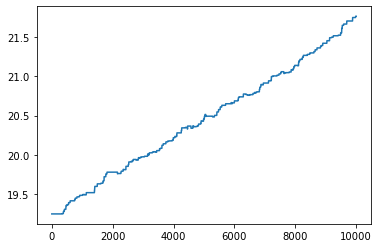

In [17]:
energy = [-(pos@g).sum() + (sped**2/2).sum() for pos, sped in zip(positions, speeds)]
plt.plot(energy)
plt.show()